<a href="https://colab.research.google.com/github/Soham0936/PaddyDiseaseClassificationModel/blob/main/PaddyDiseaseClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Import Os and Basis Libraries
import cv2
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#Matplot Images
import matplotlib.image as mpimg
# Tensflor and Keras Layer and Model and Optimize and Loss
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import *
from tensorflow.keras.losses import BinaryCrossentropy
#PreTrained Model
from tensorflow.keras.applications import *
#Image Generator DataAugmentation
#Early Stopping
from tensorflow.keras.callbacks import EarlyStopping
# Warnings Remove
import warnings
warnings.filterwarnings("ignore")
#Splitting Data
# import splitfolders
from tensorflow.keras.preprocessing import image_dataset_from_directory
import random
from sklearn.cluster import KMeans
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_path = "/content/drive/My Drive/train_images.zip"

In [ ]:
import zipfile
import os

zip_path = "/content/drive/My Drive/train_images.zip"  # Update this path if needed
extract_path = "/content/train_images"

try:
    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(extract_path)
    print("Extraction successful!")
except zipfile.BadZipFile:
    print("Error: The file is not a valid ZIP file. Please re-upload it.")
except FileNotFoundError:
    print("Error: ZIP file not found. Check the file path.")


Extraction successful!


In [ ]:
import os

files = os.listdir(extract_path)
print("Extracted files:", files)

Extracted files: ['hispa', 'bacterial_panicle_blight', 'blast', 'downy_mildew', 'dead_heart', 'bacterial_leaf_streak', 'bacterial_leaf_blight', 'tungro', 'normal', 'brown_spot']


In [ ]:
# Directory containing the "Train" folder
directory = "/content/train_images"

filepath =[]
label = []

folds = os.listdir(directory)

for fold in folds:
    f_path = os.path.join(directory , fold)

    imgs = os.listdir(f_path)

    for img in imgs:

        img_path = os.path.join(f_path , img)
        filepath.append(img_path)
        label.append(fold)

#Concat data paths with labels
file_path_series = pd.Series(filepath , name= 'filepath')
Label_path_series = pd.Series(label , name = 'label')
df_train = pd.concat([file_path_series ,Label_path_series ] , axis = 1)

In [ ]:
# Head
df_train

,filepath,label
0,/content/train_images/hispa/101522.jpg,hispa
1,/content/train_images/hispa/102138.jpg,hispa
2,/content/train_images/hispa/104682.jpg,hispa
3,/content/train_images/hispa/110343.jpg,hispa
4,/content/train_images/hispa/108682.jpg,hispa
...,...,...
10402,/content/train_images/brown_spot/107848.jpg,brown_spot
10403,/content/train_images/brown_spot/106006.jpg,brown_spot
10404,/content/train_images/brown_spot/103592.jpg,brown_spot
10405,/content/train_images/brown_spot/109259.jpg,brown_spot


In [ ]:
# Spliting in Train and Val
from sklearn.model_selection import train_test_split # Import the function
train_df , val_df = train_test_split(df_train ,train_size = 0.9 , shuffle = True ,random_state = 42 )

In [ ]:
# Shape
print(f"The shape of The Train data is: {train_df.shape}")
print(f"The shape of The Validation data is: {val_df.shape}")

The shape of The Train data is: (9366, 2)
The shape of The Validation data is: (1041, 2)


In [ ]:
#Data_Dir
data_dir = '/content/train_images'

print('Training Images:')
# creating the training dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.1,
    subset='training',
    seed=123,
    image_size=(256, 256),
    batch_size=32)

#Testing Augmented Data
print('Validation Images:')
validation_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.1,
    subset='validation',
    seed=123,
    image_size=(256, 256),
    batch_size=32)

Training Images:
Found 10407 files belonging to 10 classes.
Using 9367 files for training.
Validation Images:
Found 10407 files belonging to 10 classes.
Using 1040 files for validation.


In [ ]:
zip_path = "/content/drive/My Drive/test_images.zip"

In [ ]:
import zipfile
import os

zip_path = "/content/drive/My Drive/test_images.zip"  # Update this path if needed
extract_path = "/content/test_images"

try:
    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(extract_path)
    print("Extraction successful!")
except zipfile.BadZipFile:
    print("Error: The file is not a valid ZIP file. Please re-upload it.")
except FileNotFoundError:
    print("Error: ZIP file not found. Check the file path.")


Extraction successful!


In [ ]:
import os

files = os.listdir(extract_path)
print("Extracted files:", files)

Extracted files: ['200601.jpg', '200833.jpg', '200115.jpg', '201360.jpg', '200273.jpg', '203256.jpg', '200637.jpg', '202571.jpg', '201118.jpg', '202950.jpg', '200871.jpg', '202068.jpg', '200259.jpg', '200632.jpg', '201691.jpg', '200590.jpg', '200868.jpg', '201037.jpg', '203026.jpg', '202069.jpg', '200430.jpg', '201178.jpg', '201907.jpg', '200544.jpg', '200695.jpg', '200492.jpg', '202922.jpg', '202484.jpg', '201532.jpg', '201731.jpg', '203036.jpg', '200295.jpg', '202578.jpg', '203301.jpg', '200999.jpg', '202794.jpg', '202242.jpg', '201144.jpg', '201843.jpg', '203380.jpg', '201918.jpg', '202984.jpg', '201112.jpg', '200827.jpg', '200013.jpg', '200799.jpg', '203022.jpg', '200380.jpg', '200051.jpg', '202216.jpg', '201420.jpg', '202597.jpg', '202845.jpg', '201654.jpg', '202223.jpg', '200993.jpg', '201211.jpg', '200329.jpg', '202116.jpg', '203344.jpg', '201328.jpg', '203235.jpg', '202398.jpg', '200804.jpg', '201542.jpg', '201185.jpg', '203318.jpg', '201766.jpg', '202721.jpg', '200530.jpg', '2

In [ ]:
test_ds = keras.utils.image_dataset_from_directory(
    directory = '/content/test_images',
    batch_size = 32,
    image_size = (256, 256),
    label_mode = None,
    shuffle=False
)
test_ds = validation_ds.map(lambda x, y: (x / 255.0, y))

Found 3469 files.


In [ ]:
# Names of the classes
class_names = train_ds.class_names


# Print the class indices
print("Class indices for training generator:", class_names)

Class indices for training generator: ['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']


In [ ]:
# Shape of the dataset
for image_batch, labels_batch in train_ds:
    print("Shape of X_train: ", image_batch.shape)
    print("Shape of y_train: ", labels_batch.shape)
    break

Shape of X_train:  (32, 256, 256, 3)
Shape of y_train:  (32,)


In [ ]:
# Train Data
train_ds = train_ds.map(lambda x, y: (x / 255.0, y))
# Val Data
validation_ds = validation_ds.map(lambda x, y: (x / 255.0, y))

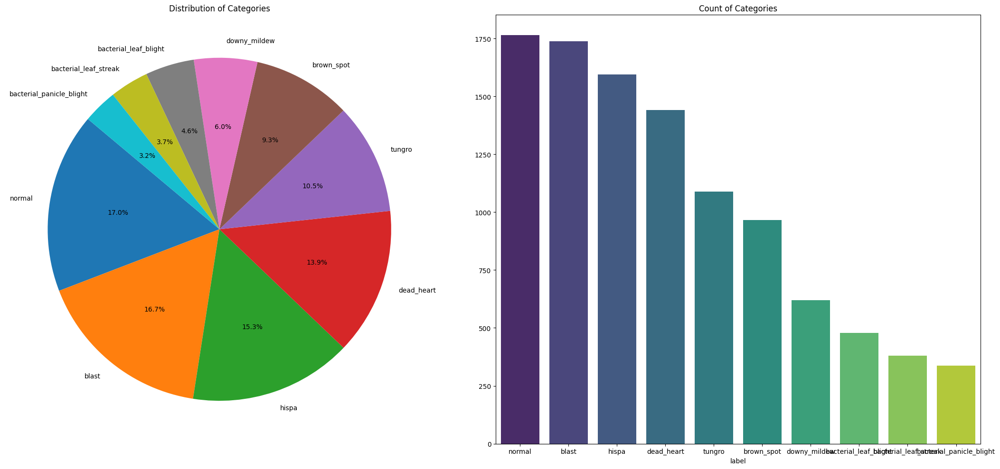

In [ ]:
# Count the occurrences of each category in the 'category' column
count = df_train['label'].value_counts()

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(22, 10), facecolor='white')

# Plot pie chart on the first subplot
palette = sns.color_palette("viridis")
sns.set_palette(palette)
axs[0].pie(count, labels=count.index, autopct='%1.1f%%', startangle=140)
axs[0].set_title('Distribution of Categories')

# Plot bar chart on the second subplot
sns.barplot(x=count.index, y=count.values, ax=axs[1], palette="viridis")
axs[1].set_title('Count of Categories')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

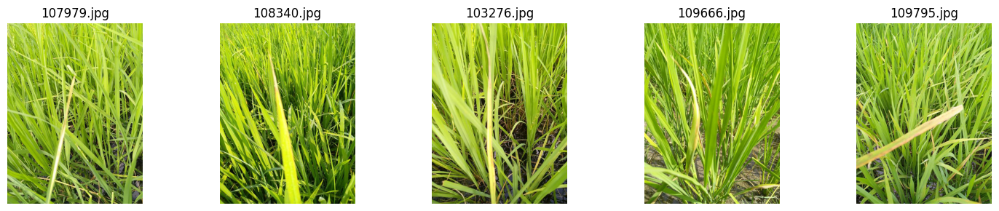

In [ ]:
def visualize_images(path, num_images=5):
    # Get a list of image filenames in the specified path
    image_filenames = os.listdir(path)

    # Limit the number of images to visualize if there are more than num_images
    num_images = min(num_images, len(image_filenames))

    # Create a figure and axis object to display images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3),facecolor='white')

    # Iterate over the selected images and display them
    for i, image_filename in enumerate(image_filenames[:num_images]):
        # Load the image using Matplotlib
        image_path = os.path.join(path, image_filename)
        image = mpimg.imread(image_path)

        # Display the image
        axes[i].imshow(image)
        axes[i].axis('off')  # Turn off axis
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display the figure
    plt.tight_layout()
    plt.show()

# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/bacterial_leaf_blight"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

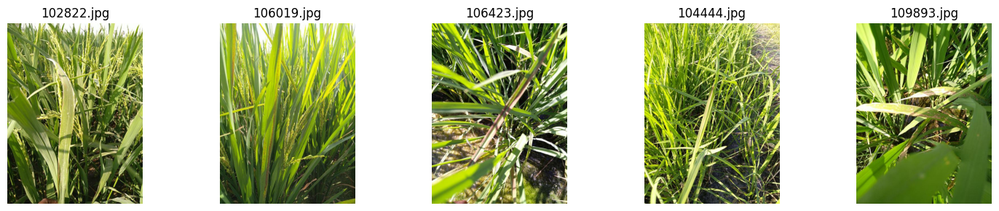

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/bacterial_leaf_streak"
# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

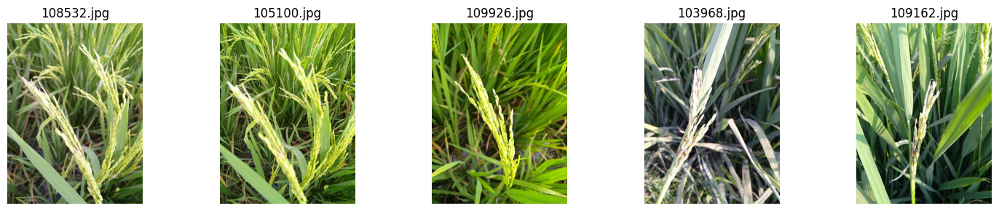

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/bacterial_panicle_blight"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

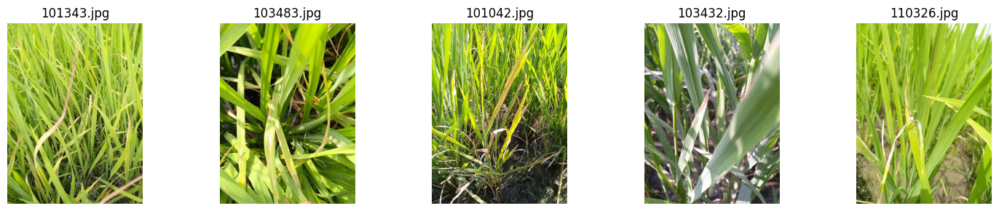

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/blast"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

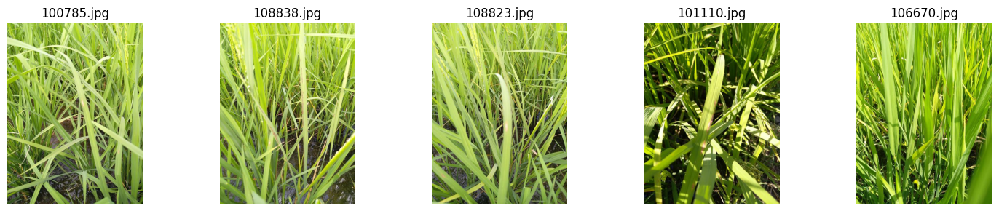

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/brown_spot"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

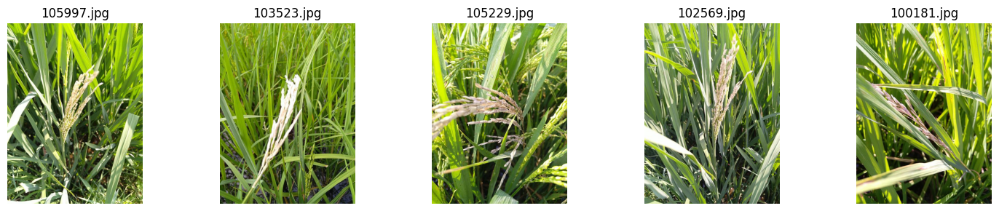

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/dead_heart"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

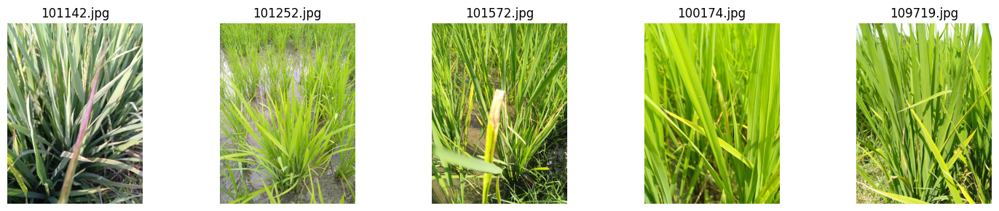

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/downy_mildew"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

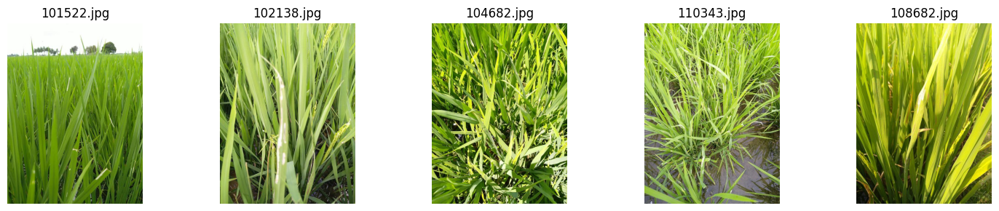

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/hispa"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

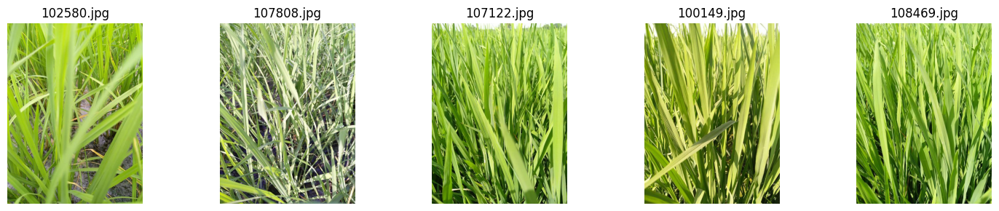

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/normal"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

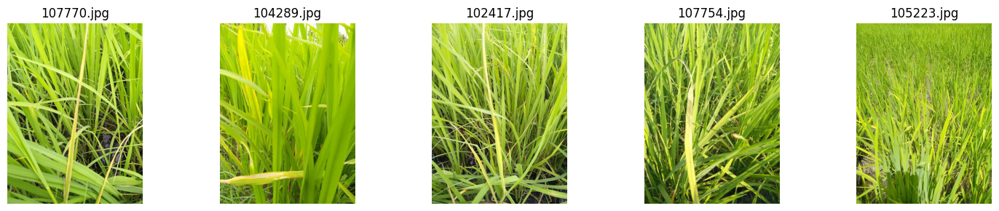

In [ ]:
# Specify the path containing the images to visualize
path_to_visualize = "/content/train_images/tungro"

# Visualize some images from the specified path
visualize_images(path_to_visualize, num_images=5)

In [ ]:
# Load the pre-trained DenseNet121 model without the top classification layer
DenseNet121_base = DenseNet121(weights='imagenet',
                                    include_top=False,
                                   input_shape=(256, 256, 3),
                                     pooling = 'avg'
                                   )

# Freeze the pre-trained base model layers
DenseNet121_base.trainable = False

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Build the model
model = Sequential()

# Add the pre-trained DenseNet121_base
model.add(DenseNet121_base)

# Batch Normalization
model.add(BatchNormalization())

#Dropout
model.add(Dropout(0.35))

# Add a dense layer with 120 units and ReLU activation function
model.add(Dense(220, activation='relu'))


# Add the output layer with 1 unit and sigmoid activation function for binary classification
model.add(Dense(10, activation='softmax'))

# Compile
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)             │ (None, 1024)                │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 220)                 │         225,500 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           2,210 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,269,310 (27.73 MB)

 Trainable params: 229,758 (897.49 KB)

 Non-trainable params: 7,039,552 (26.85 MB)

In [ ]:
#Early_Stopping
early_stopping = EarlyStopping(
    patience=10,
    restore_best_weights=True,
)

# Train the model
history = model.fit(train_ds,
                    epochs=100,
                    validation_data=validation_ds,
                    callbacks=early_stopping)

Epoch 1/100
293/293 ━━━━━━━━━━━━━━━━━━━━ 2644s 9s/step - accuracy: 0.5094 - loss: 1.4672 - val_accuracy: 0.7644 - val_loss: 0.7892
Epoch 2/100
127/293 ━━━━━━━━━━━━━━━━━━━━ 22:02 8s/step - accuracy: 0.7644 - loss: 0.7196

In [ ]:
# Evaluate the model on the validation dataset
validation_loss, validation_accuracy = model.evaluate(validation_ds)

# Print the validation loss and accuracy
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.9556 - loss: 0.1457
Validation Loss: 0.1778714805841446
Validation Accuracy: 0.9490384459495544


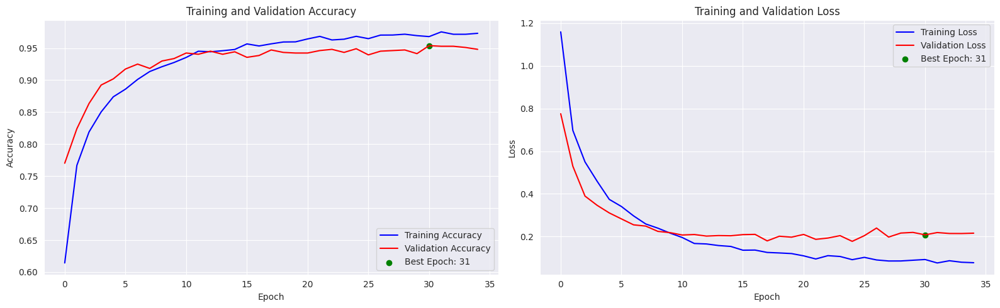

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Get the epoch with the highest validation accuracy
best_epoch = history.history['val_accuracy'].index(max(history.history['val_accuracy'])) + 1

# Set the background style using seaborn
#plt.style.use('darkgrid') # This line caused the error
sns.set_style('darkgrid')  # Use seaborn to set the style


# Create a subplot with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Plot training and validation accuracy
axs[0].plot(history.history['accuracy'], label='Training Accuracy', color='blue')
axs[0].plot(history.history['val_accuracy'], label='Validation Accuracy', color='red')
axs[0].scatter(best_epoch - 1, history.history['val_accuracy'][best_epoch - 1], color='green', label=f'Best Epoch: {best_epoch}')
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_title('Training and Validation Accuracy')
axs[0].legend()

# Plot training and validation loss
axs[1].plot(history.history['loss'], label='Training Loss', color='blue')
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='red')
axs[1].scatter(best_epoch - 1, history.history['val_loss'][best_epoch - 1], color='green',label=f'Best Epoch: {best_epoch}')
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training and Validation Loss')
axs[1].legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

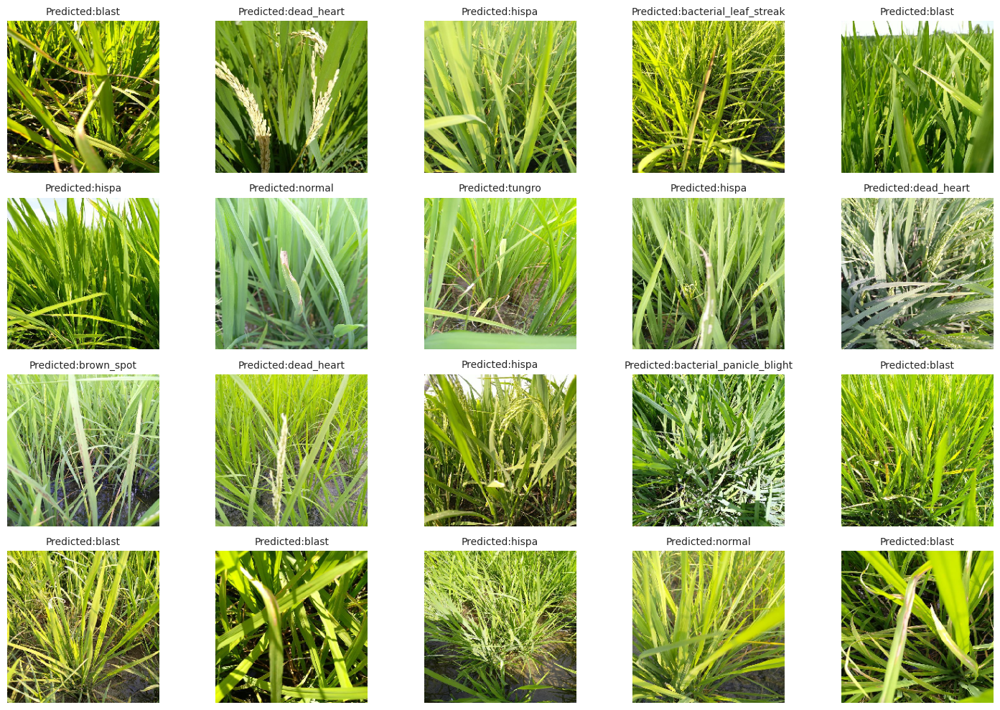

In [50]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
from sklearn.cluster import KMeans
from tensorflow.keras.models import load_model

# Define the directory containing unlabeled images
images_dir = '/content/test_images'

# Define a dictionary to map predicted class indices to class names
class_names = {
    0: 'bacterial_leaf_blight',
    1: 'bacterial_leaf_streak',
    2: 'bacterial_panicle_blight',
    3: 'blast',
    4: 'brown_spot',
    5: 'dead_heart',
    6: 'downy_mildew',
    7: 'hispa',
    8: 'normal',
    9: 'tungro'
}

# Randomly select 20 image files from the directory
image_files = os.listdir(images_dir)
random_images = random.sample(image_files, 20)


# Extract features from each image
features = []
for img_file in random_images:
    img_path = os.path.join(images_dir, img_file)
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features.append(model.predict(x).flatten())

# Convert list of feature vectors to numpy array
features = np.array(features)

# Perform K-means clustering
kmeans = KMeans(n_clusters=10, random_state=42)
clusters = kmeans.fit_predict(features)

# Function to display images with predicted labels
def display_images_with_labels(images, labels):
    plt.figure(figsize=(15, 10))
    for i, img_file in enumerate(images):
        img_path = os.path.join(images_dir, img_file)
        img = image.load_img(img_path, target_size=(224, 224))
        plt.subplot(4, 5, i + 1)
        plt.imshow(img)
        plt.title(f"Predicted:{labels[i]}", fontsize=10)  # Wrap text
        plt.axis('off')

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

# Predicted labels for each image
predicted_labels = []

# Print predicted labels for each image and display images
for img_file in random_images:
    img_path = os.path.join(images_dir, img_file)
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    predicted_label_index = model.predict(x)
    predicted_label = class_names[np.argmax(predicted_label_index)]  # Map predicted class index to class name
    predicted_labels.append(predicted_label)

# Display images with predicted labels
display_images_with_labels(random_images, predicted_labels)